# Classifier comparison
A comparison of a several classifiers in scikit-learn on synthetic datasets. My main goal is to study the performance of classifiers as a function of number of training data. 

list of the classifiers:  
-Linear SVM  
-RBF SVM  
-LogisticRegression  
-Neural Net  
-Decision Tree  
-Random Forest  
-AdaBoost  
-Naive Bayes  
-QDA  

In [10]:
import warnings
warnings.simplefilter(action="ignore", category=DeprecationWarning)
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter(action="ignore", category=ConvergenceWarning)

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

%matplotlib inline

Automatically created module for IPython interactive environment
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Random Forest', 'Naive Bayes', 'QDA']
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'Naive Bayes', 'QDA']
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Decision Tree', 'Random Forest', 'AdaBoost']


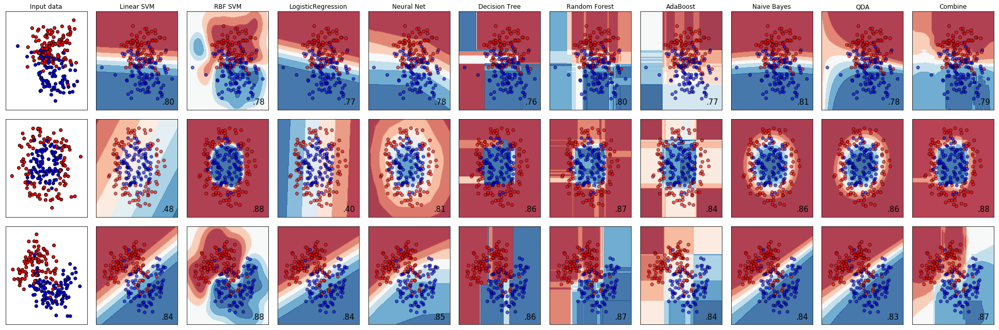

In [12]:
print(__doc__)

h = .02  # step size in the mesh

names = ["Linear SVM", "RBF SVM", "LogisticRegression", "Neural Net", 
         "Decision Tree", "Random Forest", "AdaBoost", 
         "Naive Bayes", "QDA"]

classifiers = [
    SVC(kernel="linear", C=0.025, probability=True),
    SVC(gamma=2, C=1, probability=True),
    LogisticRegression(),
    MLPClassifier(hidden_layer_sizes=20, alpha=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

X, y = make_classification(n_samples=400, n_features=2, n_redundant=0, n_informative=2,
                           random_state=3, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 3 * rng.uniform(size=X.shape) 
linearly_separable = (X, y)

datasets = [linearly_separable,
            make_circles(n_samples=400, noise=0.2, factor=0.5, random_state=1),
            make_moons(n_samples=400, noise=0.3, random_state=0)
            ]

figure = plt.figure(figsize=(27, 9))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    index = np.random.rand(ds[0].shape[0]) > 0.0
    X, y = ds[0][index], ds[1][index]
    X = StandardScaler().fit_transform(X)
    
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.5, random_state=42)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    
    

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # and testing points
#     ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
#                edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    models = []
    for name, clf in zip(names, classifiers):
#        print("Classifier ", name)
        ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
#         if hasattr(clf, "decision_function"):
#             Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
#         else:
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
    
        models.append((name, score, clf.predict_proba(X_test), Z))

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot also the training points
#         ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
#                    edgecolors='k')
        # and testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        i += 1
        
    # combine models
    median_score = np.median([x[1] for x in models])
    best_models = [x[0] for x in models if x[1] >= median_score]
#    print(median_score)
#    print([x[1] for x in models])
    print('Models with best performance ', best_models)
    
    prob = np.zeros(models[0][2].shape)
    Z = np.zeros(models[0][3].shape)
    for model in models:
        if model[0] in best_models:
            prob += model[2]
            Z += model[3]
            
    prob /= len(best_models)
    Z /= len(best_models)
    score = accuracy_score([np.argmax(x) for x in prob], y_test)
    
    Z = Z.reshape(xx.shape)
    ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
    ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
    
        # Plot also the training points
#     ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
#                edgecolors='k')
    # and testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
               edgecolors='k', alpha=0.6)

    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    if ds_cnt == 0:
        ax.set_title('Combine')
    ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
            size=15, horizontalalignment='right')
    
    i += 1

plt.tight_layout()
plt.show()

Number of data point 22
Models with best performance  ['LogisticRegression', 'Neural Net', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
Number of data point 24
Models with best performance  ['RBF SVM', 'Decision Tree', 'AdaBoost', 'Naive Bayes', 'QDA']
Number of data point 24
Models with best performance  ['RBF SVM', 'LogisticRegression', 'Decision Tree', 'Random Forest', 'Naive Bayes']


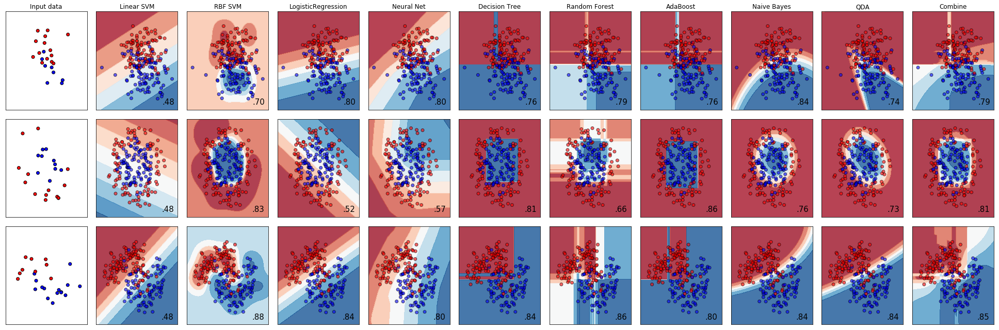

Number of data point 43
Models with best performance  ['LogisticRegression', 'Neural Net', 'Decision Tree', 'Naive Bayes', 'QDA']
Number of data point 46
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
Number of data point 31
Models with best performance  ['RBF SVM', 'LogisticRegression', 'Decision Tree', 'AdaBoost', 'Naive Bayes']


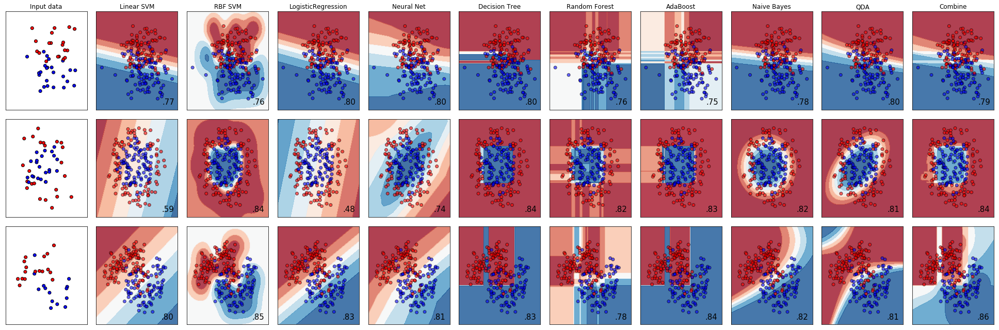

Number of data point 61
Models with best performance  ['Linear SVM', 'LogisticRegression', 'Neural Net', 'Random Forest', 'Naive Bayes']
Number of data point 58
Models with best performance  ['RBF SVM', 'Random Forest', 'AdaBoost', 'Naive Bayes', 'QDA']
Number of data point 60
Models with best performance  ['RBF SVM', 'LogisticRegression', 'Neural Net', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']


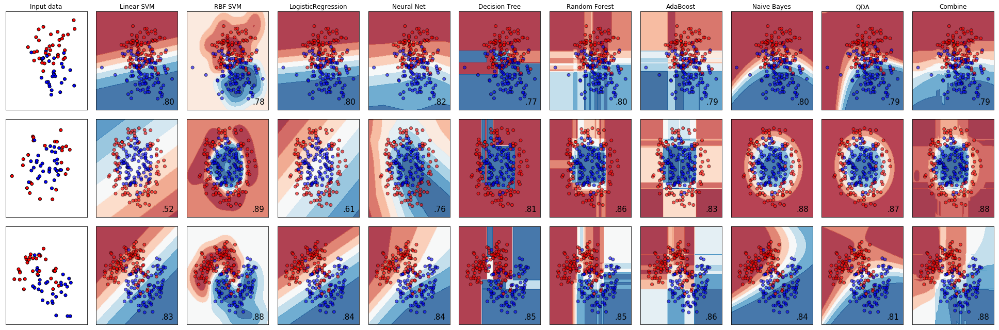

Number of data point 78
Models with best performance  ['Linear SVM', 'LogisticRegression', 'Neural Net', 'Naive Bayes', 'QDA']
Number of data point 79
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'QDA']
Number of data point 66
Models with best performance  ['Linear SVM', 'RBF SVM', 'Random Forest', 'Naive Bayes', 'QDA']


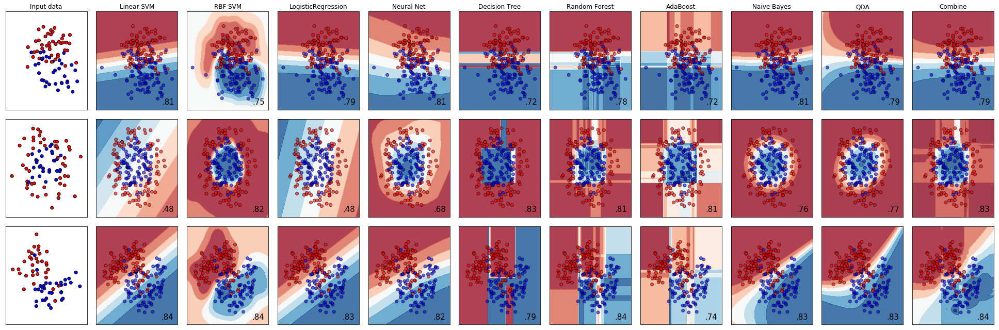

Number of data point 93
Models with best performance  ['Linear SVM', 'LogisticRegression', 'Neural Net', 'Naive Bayes', 'QDA']
Number of data point 97
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes', 'QDA']
Number of data point 101
Models with best performance  ['Linear SVM', 'RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'QDA']


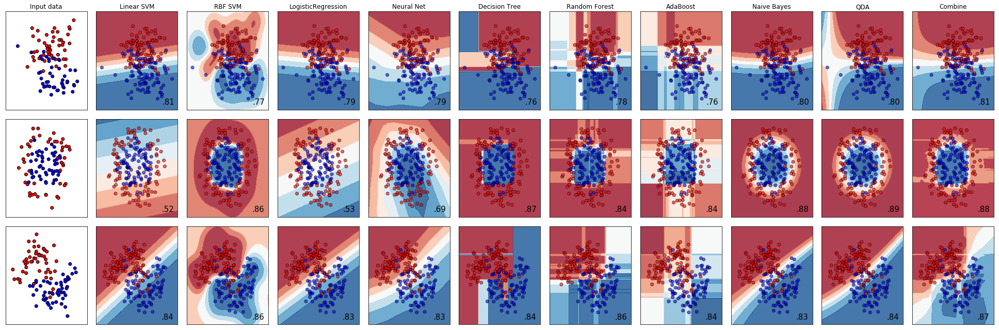

Number of data point 106
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 121
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'QDA']
Number of data point 127
Models with best performance  ['Linear SVM', 'RBF SVM', 'LogisticRegression', 'Neural Net', 'Decision Tree', 'Random Forest', 'Naive Bayes', 'QDA']


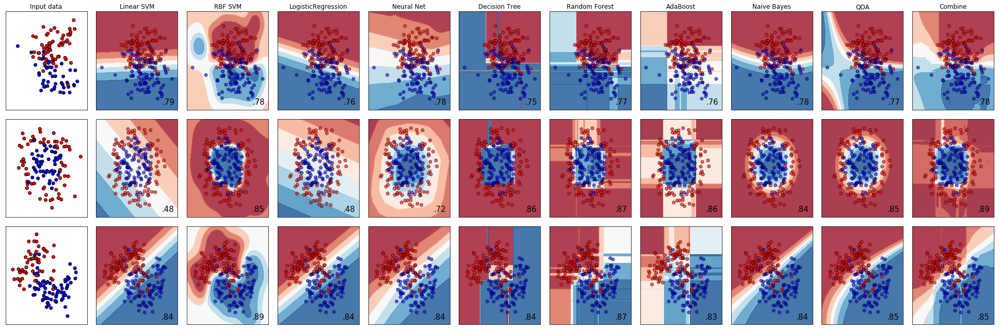

Number of data point 138
Models with best performance  ['Linear SVM', 'RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
Number of data point 155
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes', 'QDA']
Number of data point 131
Models with best performance  ['RBF SVM', 'Neural Net', 'Decision Tree', 'Random Forest', 'AdaBoost']


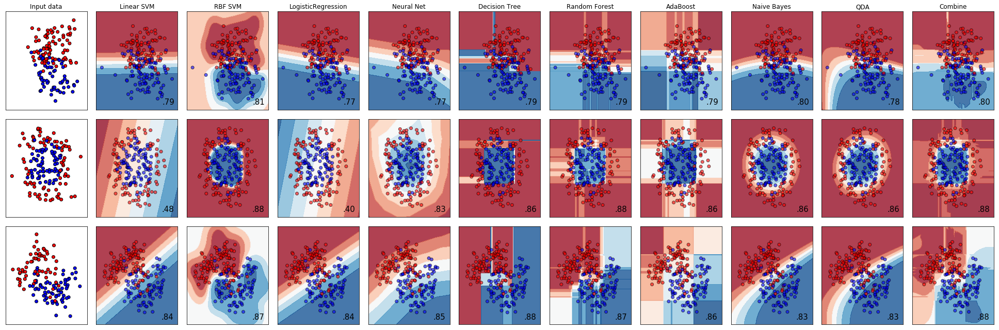

Number of data point 158
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 162
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 156
Models with best performance  ['Linear SVM', 'RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost']


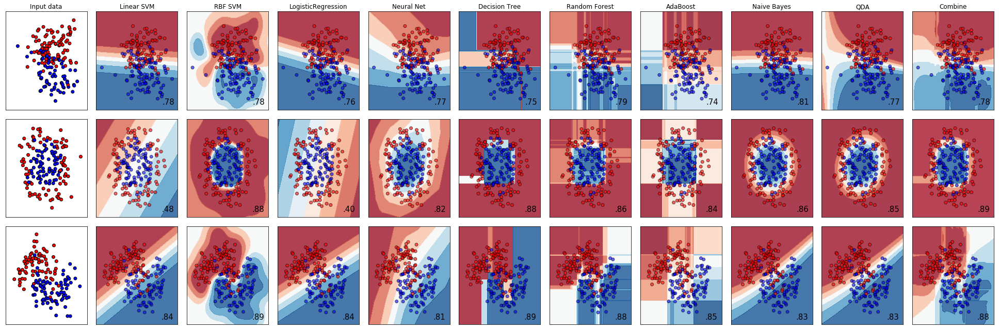

Number of data point 176
Models with best performance  ['Linear SVM', 'RBF SVM', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 180
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Naive Bayes']
Number of data point 175
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Random Forest', 'AdaBoost']


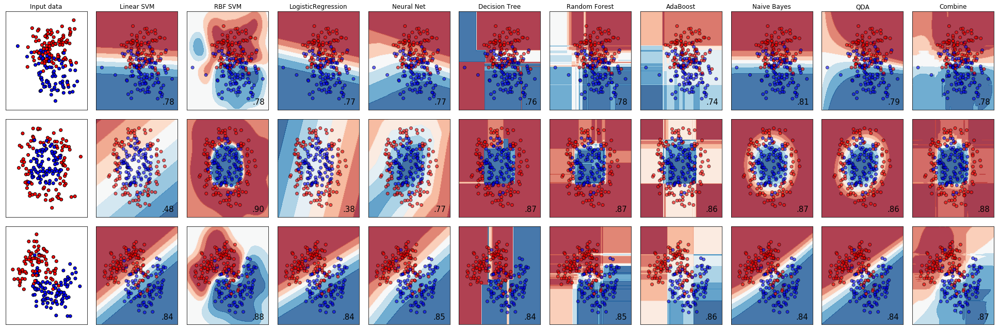

Number of data point 200
Models with best performance  ['Linear SVM', 'RBF SVM', 'Neural Net', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 200
Models with best performance  ['RBF SVM', 'Decision Tree', 'Random Forest', 'Naive Bayes', 'QDA']
Number of data point 200
Models with best performance  ['Linear SVM', 'RBF SVM', 'Decision Tree', 'Random Forest', 'AdaBoost']


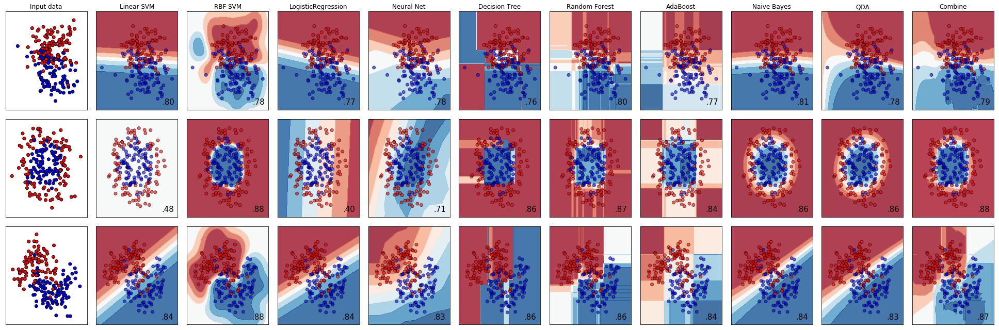

In [13]:
scores_all = []
for ratio in range(1, 11):
    figure = plt.figure(figsize=(27, 9))
    i = 1
    for ds_cnt, ds in enumerate(datasets):
        scores = []
        # preprocess dataset, split into training and test part
        X, y = ds
        X = StandardScaler().fit_transform(X)

        X_train, X_test, y_train, y_test = \
            train_test_split(X, y, test_size=.5, random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))
        
        index = np.random.rand(X_train.shape[0]) < (ratio/10)
        print("Number of data point", sum(index))
        X_train = X_train[index]
        y_train = y_train[index]

        # just plot the dataset first
        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['#FF0000', '#0000FF'])
        ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
        if ds_cnt == 0:
            ax.set_title("Input data")
        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
#         # and testing points
#         ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
#                    edgecolors='k')
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        i += 1

        # iterate over classifiers
        models = []
        for name, clf in zip(names, classifiers):
    #        print("Classifier ", name)
            ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
            clf.fit(X_train, y_train)
            score = clf.score(X_test, y_test)
            scores.append(score)

            # Plot the decision boundary. For that, we will assign a color to each
            # point in the mesh [x_min, x_max]x[y_min, y_max].
    #         if hasattr(clf, "decision_function"):
    #             Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    #         else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

            models.append((name, score, clf.predict_proba(X_test), Z))

            # Put the result into a color plot
            Z = Z.reshape(xx.shape)
            ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

            # Plot also the training points
    #         ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
    #                    edgecolors='k')
            # and testing points
            ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                       edgecolors='k', alpha=0.6)

            ax.set_xlim(xx.min(), xx.max())
            ax.set_ylim(yy.min(), yy.max())
            ax.set_xticks(())
            ax.set_yticks(())
            if ds_cnt == 0:
                ax.set_title(name)
            ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                    size=15, horizontalalignment='right')
            i += 1

        # combine models
        median_score = np.median([x[1] for x in models])
        best_models = [x[0] for x in models if x[1] >= median_score]
    #    print(median_score)
    #    print([x[1] for x in models])
        print('Models with best performance ', best_models)

        prob = np.zeros(models[0][2].shape)
        Z = np.zeros(models[0][3].shape)
        for model in models:
            if model[0] in best_models:
                prob += model[2]
                Z += model[3]

        prob /= len(best_models)
        Z /= len(best_models)
        score = accuracy_score([np.argmax(x) for x in prob], y_test)
        scores.append(score)

        Z = Z.reshape(xx.shape)
        ax = plt.subplot(len(datasets), len(classifiers) + 2, i)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

            # Plot also the training points
    #     ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
    #                edgecolors='k')
        # and testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title('Combine')
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')

        i += 1
    
        scores_all.append(scores)
    plt.tight_layout()
    plt.show()

Linear dataset


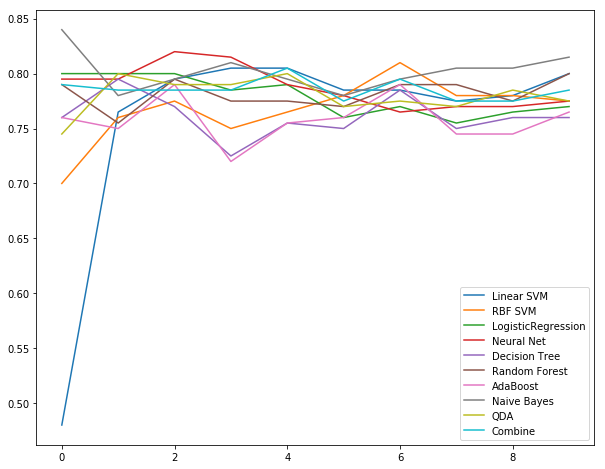

In [14]:
print("Linear dataset")
df = pd.DataFrame(scores_all[0::3], columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

Sphere dataset


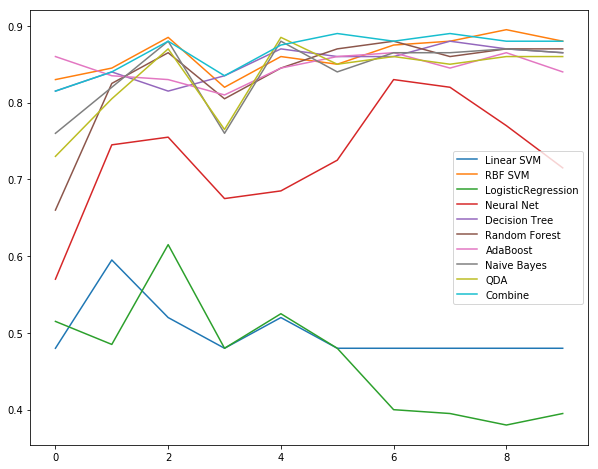

In [15]:
print("Sphere dataset")
df = pd.DataFrame(scores_all[1::3], columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

Moon dataset


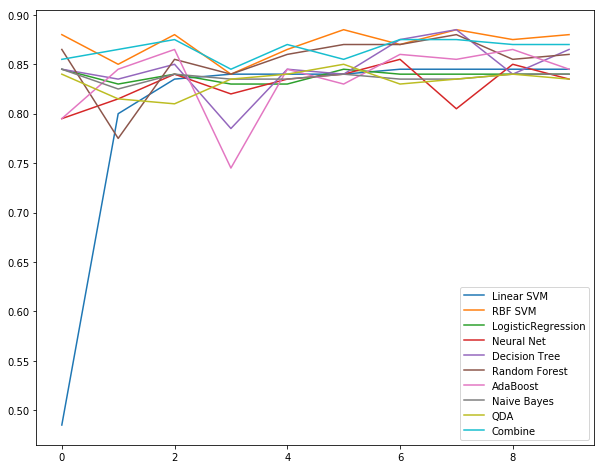

In [16]:
print("Moon dataset")
df = pd.DataFrame(scores_all[2::3], columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

## Average over multi-dataset

In [54]:
samples = []
for seed in range(1,31):
    X, y = make_classification(n_samples=400, n_features=2, n_redundant=0, n_informative=2,
                               random_state=seed, n_clusters_per_class=1)
    rng = np.random.RandomState(2)
    X += 3 * rng.uniform(size=X.shape) 
    linearly_separable = (X, y)

    datasets = [linearly_separable,
                make_circles(n_samples=400, noise=0.2, factor=0.5, random_state=seed),
                make_moons(n_samples=400, noise=0.3, random_state=seed)
                ]
    
    scores_all = []
    for ratio in range(1, 11):
        for ds_cnt, ds in enumerate(datasets):
            scores = []
            # preprocess dataset, split into training and test part
            X, y = ds
            X = StandardScaler().fit_transform(X)

            X_train, X_test, y_train, y_test = \
                train_test_split(X, y, test_size=.5, random_state=42)

            x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
            y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
            xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                                 np.arange(y_min, y_max, h))

            index = np.random.rand(X_train.shape[0]) < (ratio/10)
#            print("Number of data point", sum(index))
            X_train = X_train[index]
            y_train = y_train[index]

            # iterate over classifiers
            models = []
            for name, clf in zip(names, classifiers):
                
                clf.fit(X_train, y_train)
                score = clf.score(X_test, y_test)
                scores.append(score)

                models.append((name, score, clf.predict_proba(X_test)))

            # combine models
            median_score = np.median([x[1] for x in models])
            best_models = [x[0] for x in models if x[1] >= median_score]

            prob = np.zeros(models[0][2].shape)
            for model in models:
                if model[0] in best_models:
                    prob += model[2]

            prob /= len(best_models)
            score = accuracy_score([np.argmax(x) for x in prob], y_test)
            scores.append(score)

            scores_all.append(scores)
    samples.append(scores_all)

In [55]:
result = samples[0][0::3]
for sample in samples[1:]:
    for i, sub in enumerate(sample[0::3]):
        for j, val in enumerate(sub):
            result[i][j] += val

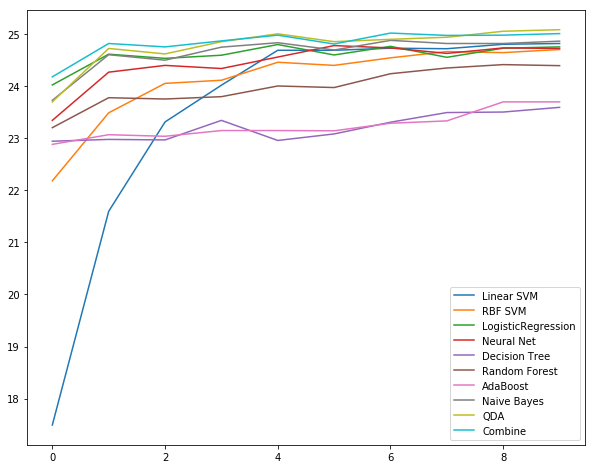

In [56]:
df = pd.DataFrame(result, columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

In [57]:
result = samples[0][1::3]
for sample in samples[1:]:
    for i, sub in enumerate(sample[1::3]):
        for j, val in enumerate(sub):
            result[i][j] += val

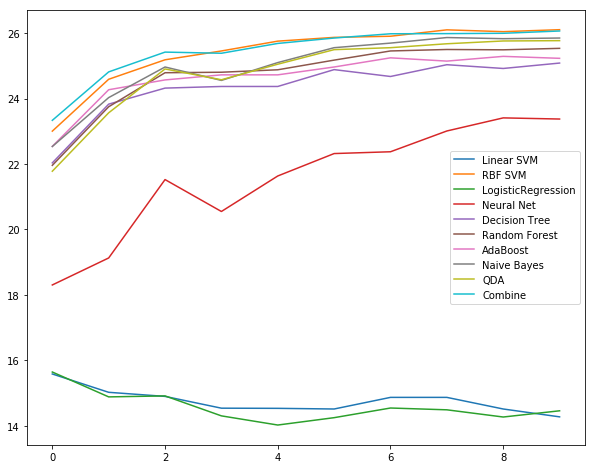

In [58]:
df = pd.DataFrame(result, columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

In [59]:
result = samples[0][2::3]
for sample in samples[1:]:
    for i, sub in enumerate(sample[2::3]):
        for j, val in enumerate(sub):
            result[i][j] += val

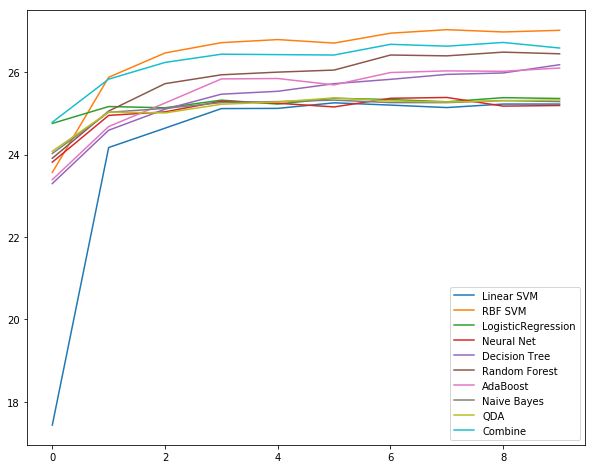

In [60]:
df = pd.DataFrame(result, columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

## Number of features

In [61]:
samples = []
for seed in range(1,31):
    X, y = make_classification(n_samples=400, n_features=10, n_redundant=0, n_informative=10,
                               random_state=seed, n_clusters_per_class=1)
    rng = np.random.RandomState(2)
    X += 3 * rng.uniform(size=X.shape) 
    linearly_separable = (X, y)

    datasets = [linearly_separable,
                make_circles(n_samples=400, noise=0.2, factor=0.5, random_state=seed),
                make_moons(n_samples=400, noise=0.3, random_state=seed)
                ]
    
    scores_all = []
    for ratio in range(1, 11):
        for ds_cnt, ds in enumerate(datasets):
            scores = []
            # preprocess dataset, split into training and test part
            X, y = ds
            X = StandardScaler().fit_transform(X)

            X_train, X_test, y_train, y_test = \
                train_test_split(X, y, test_size=.5, random_state=42)

            x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
            y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
            xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                                 np.arange(y_min, y_max, h))

            index = np.random.rand(X_train.shape[0]) < (ratio/10)
#            print("Number of data point", sum(index))
            X_train = X_train[index]
            y_train = y_train[index]

            # iterate over classifiers
            models = []
            for name, clf in zip(names, classifiers):
                
                clf.fit(X_train, y_train)
                score = clf.score(X_test, y_test)
                scores.append(score)

                models.append((name, score, clf.predict_proba(X_test)))

            # combine models
            median_score = np.median([x[1] for x in models])
            best_models = [x[0] for x in models if x[1] >= median_score]

            prob = np.zeros(models[0][2].shape)
            for model in models:
                if model[0] in best_models:
                    prob += model[2]

            prob /= len(best_models)
            score = accuracy_score([np.argmax(x) for x in prob], y_test)
            scores.append(score)

            scores_all.append(scores)
    samples.append(scores_all)

/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Users/mrahimi/Software/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:682: 

In [62]:
result = samples[0][0::3]
for sample in samples[1:]:
    for i, sub in enumerate(sample[0::3]):
        for j, val in enumerate(sub):
            result[i][j] += val

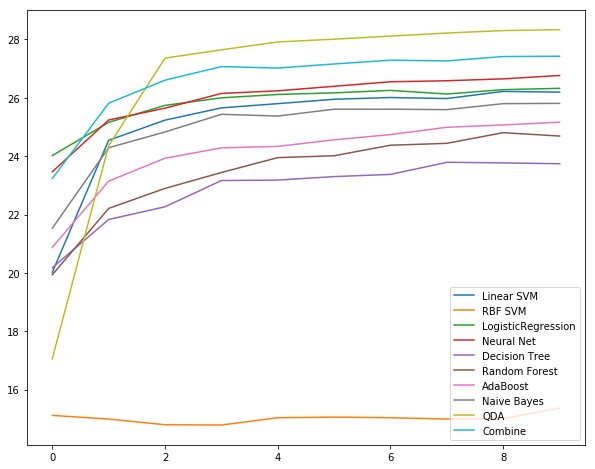

In [63]:
df = pd.DataFrame(result, columns=[*names, "Combine"])
df.plot(figsize=(10, 8))

## What I learned 
* The performance highly depends on the data rather than the number of data.  
* SVM is not the best model for small dataset. It has a high chance to overfit.
* Logistic regression is stable even for small dataset.
* Tree-based models have better performance than what I expected.